In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from math import sqrt

In [8]:
df=pd.read_excel('all_data.xlsx')
df1 = df.copy()
df1 = df.drop(['Cation','Molar volume (cm3/mol)','Avg. polarizability(Å3)','Molecular weight (g/mol)','Energy (eV)'], axis=1)
x = df1.drop(["BE (eV)"], axis=1)
y = df1["BE (eV)"]

In [9]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=15)

In [17]:
x_train.shape

(135, 12)

In [12]:
x_test.shape

(34, 12)

upon addition of PMIM in x_test data

In [19]:
x_test1=pd.read_excel('xtest.xlsx')

In [5]:
x_test1.columns

Index(['Unnamed: 0', 'Cation', 'BE (eV)', 'Stage', 'No. of cations',
       ' HOMO (eV)', ' LUMO (eV)', 'Dipole moment (D)', 'No. of hetero atoms',
       'Avg. charge on hetero Atom |e|', 'No. of gallery',
       'Avg. ionic radius(Å) ', 'Avg. Pauling electronegativity',
       'Avg. 1st ionization potential (kJ/mol)',
       'Avg. number of valence electrons'],
      dtype='object')

In [20]:
x_test2 = x_test1.drop(['Unnamed: 0', 'Cation', 'BE (eV)'], axis=1)

In [21]:
x_test2.shape

(36, 12)

In [14]:
x_test.to_excel('xtest.xlsx')
y_test.to_excel('ytest.xlsx')
y_train.to_excel('ytrain.xlsx')
x_train.to_excel('xtrain.xlsx')

In [10]:
xgb = XGBRegressor(random_state=42,objective='reg:squarederror')
from xgboost import plot_importance

In [11]:
xgbr = XGBRegressor(base_score=0.1, cv=2, learning_rate=0.15, max_depth=2,
             n_estimators=1800, objective='reg:squarederror', random_state=42,
             verbose=45)
reg_xg = xgbr.fit(x_train, y_train)
xgbr_test_pred = xgbr.predict(x_test)
print("TEST_RMSE:",sqrt(mean_squared_error(y_test, xgbr_test_pred)))

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning: [04:47:43] WARNING: /workspace/src/learner.cc:742: 
Parameters: { "cv", "verbose" } are not used.

  warnings.warn(smsg, UserWarning)


TEST_RMSE: 0.14917159621579243


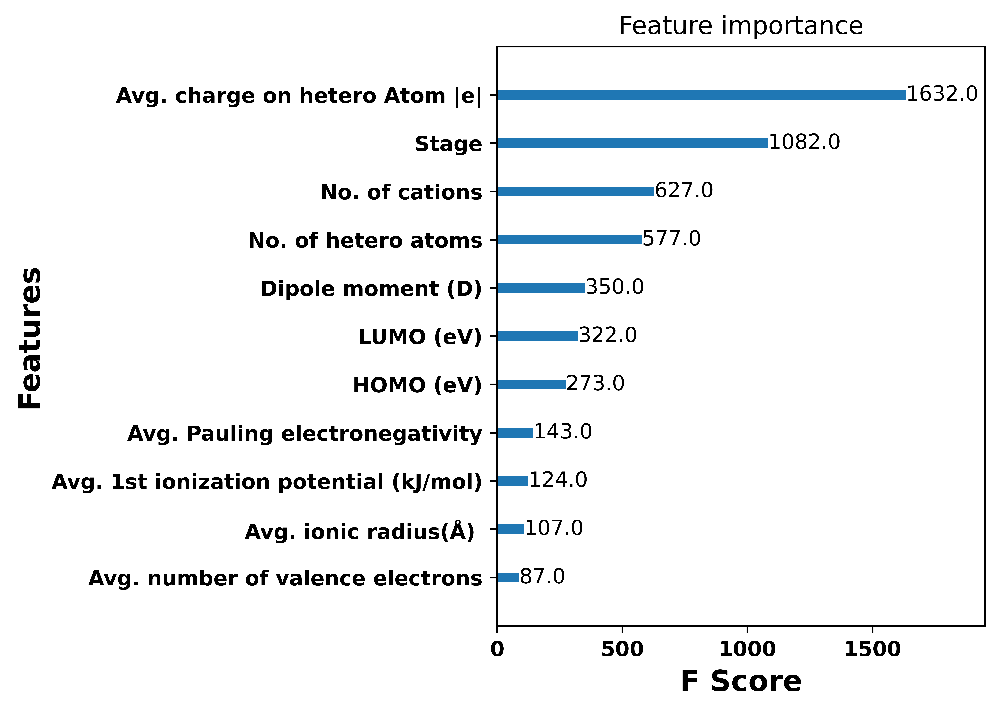

In [ ]:
import matplotlib
from matplotlib import pyplot as plt
from xgboost import plot_importance
plot_importance(reg_xg);
plt.tight_layout()
plt.xlabel('F Score', fontsize = 14,weight='bold')
plt.ylabel('Features', fontsize = 14,weight='bold')
plt.gca().set_aspect('auto', adjustable='box')
plt.xticks(weight='bold')
plt.yticks(weight='bold')
plt.barh(color="g",align="center", width = 20, y = 12)
plt.xlim(0,1950)
#plt.ylim(0,140000)
#plt.legend(fontsize=18)
plt.grid(False)
matplotlib.rc('axes',edgecolor='black')
plt.rcParams['figure.dpi']=1000
plt.show()

In [13]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 8.8 MB/s eta 0:00:00


In [14]:
import shap

In [21]:
xg_explainer = shap.TreeExplainer(reg_xg)
# Calculate Shap values
xg_shap_values = xg_explainer.shap_values(x_test)

[06:02:06] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


In [22]:
explainer = shap.Explainer(reg_xg, x_test)
shap_values = explainer(x_test)

[06:02:53] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


## SHAP global **FI**

In [ ]:
shap.plots.bar(shap_values, max_display=12, show = False)
plt.xticks(fontsize=16, fontweight='bold', color='black')
plt.yticks(fontsize=16, fontweight='bold', color='black')
#plt.xlim(0,0.5)
plt.xlabel("mean(|SHAP Value|",fontsize=16, fontweight='bold')

Text(0.5, 0, 'mean(|SHAP Value|')

LOCAL

In [ ]:
shap.plots.bar(shap_values[0], max_display=12, show = False)
plt.xticks(fontsize=16, fontweight='bold', color='black')
plt.yticks(fontsize=16, fontweight='bold', color='black')
plt.xlabel("SHAP Value",fontsize=16, fontweight='bold')

Text(0.5, 0, 'SHAP Value')

In [ ]:
import matplotlib.pyplot as plt
shap.plots.beeswarm(shap_values, color=plt.get_cmap("autumn"), max_display=12, show = False)
plt.xticks(fontsize=16, fontweight='bold', color='black')
plt.yticks(fontsize=16, fontweight='bold', color='black')
plt.xlabel("SHAP Value (impact on model output)",fontsize=16, fontweight='bold')

Text(0.5, 0, 'SHAP Value (impact on model output)')

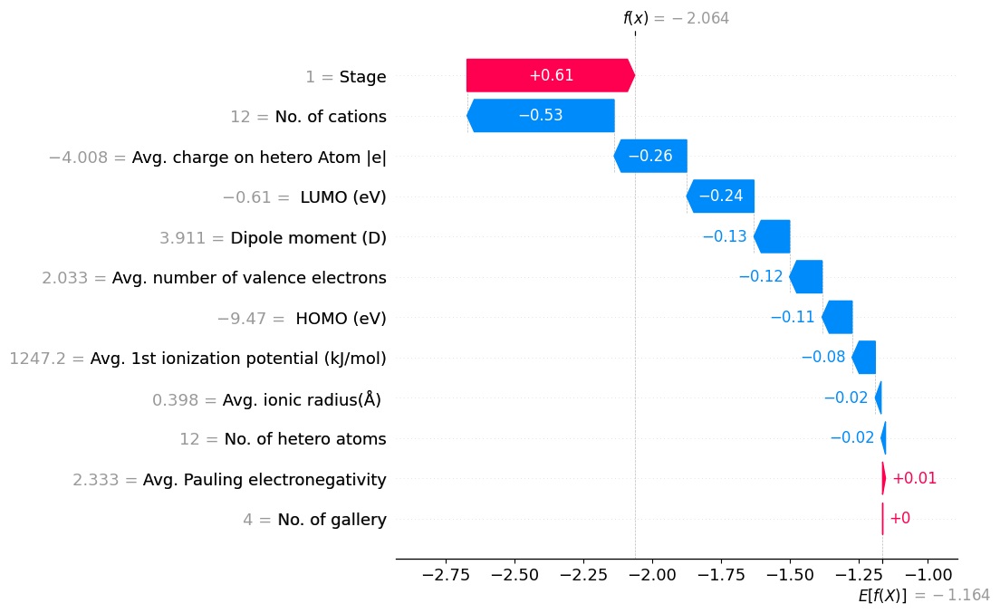

In [ ]:
shap.plots.waterfall(shap_values[0], max_display=12)

In [ ]:
x_test.columns

Index(['Stage', 'No. of cations', ' HOMO (eV)', ' LUMO (eV)',
       'Dipole moment (D)', 'No. of hetero atoms',
       'Avg. charge on hetero Atom |e|', 'No. of gallery',
       'Avg. ionic radius(Å) ', 'Avg. Pauling electronegativity',
       'Avg. 1st ionization potential (kJ/mol)',
       'Avg. number of valence electrons'],
      dtype='object')

In [ ]:
xg_features =['Stage', 'No. of cations', ' HOMO (eV)', ' LUMO (eV)',
       'Dipole moment (D)', 'No. of hetero atoms',
       'Avg. charge on hetero Atom |e|', 'No. of gallery',
       'Avg. ionic radius(Å) ', 'Avg. Pauling electronegativity',
       'Avg. 1st ionization potential (kJ/mol)',
       'Avg. number of valence electrons']

In [ ]:
import matplotlib.pyplot as plt
shap.summary_plot(xg_shap_values, x_test, feature_names=xg_features, plot_type="bar",show = False )
#plt.xlim(0,0.7)
plt.savefig('shap_feature-importance.png', dpi=1200)
plt.xticks(fontsize=16, fontweight='bold', color='black')
plt.yticks(fontsize=16, fontweight='bold', color='black')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'No. of gallery'),
  Text(0, 1, 'Avg. Pauling electronegativity'),
  Text(0, 2, 'Avg. number of valence electrons'),
  Text(0, 3, 'No. of hetero atoms'),
  Text(0, 4, 'Avg. ionic radius(Å) '),
  Text(0, 5, 'Dipole moment (D)'),
  Text(0, 6, 'Avg. 1st ionization potential (kJ/mol)'),
  Text(0, 7, 'Avg. charge on hetero Atom |e|'),
  Text(0, 8, ' HOMO (eV)'),
  Text(0, 9, ' LUMO (eV)'),
  Text(0, 10, 'Stage'),
  Text(0, 11, 'No. of cations')])

In [ ]:
shap.summary_plot(xg_shap_values, x_train, feature_names=xg_features,show = False)
plt.xlim(-4,3)
plt.savefig('shap_feature-importance1.png', dpi=1200)
plt.xticks(fontsize=14, fontweight='bold', color='black')
plt.yticks(fontsize=14, fontweight='bold', color='black')

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'No. of gallery'),
  Text(0, 1, 'Avg. Pauling electronegativity'),
  Text(0, 2, 'Avg. number of valence electrons'),
  Text(0, 3, 'No. of hetero atoms'),
  Text(0, 4, 'Avg. ionic radius(Å) '),
  Text(0, 5, 'Dipole moment (D)'),
  Text(0, 6, 'Avg. 1st ionization potential (kJ/mol)'),
  Text(0, 7, 'Avg. charge on hetero Atom |e|'),
  Text(0, 8, ' HOMO (eV)'),
  Text(0, 9, ' LUMO (eV)'),
  Text(0, 10, 'Stage'),
  Text(0, 11, 'No. of cations')])

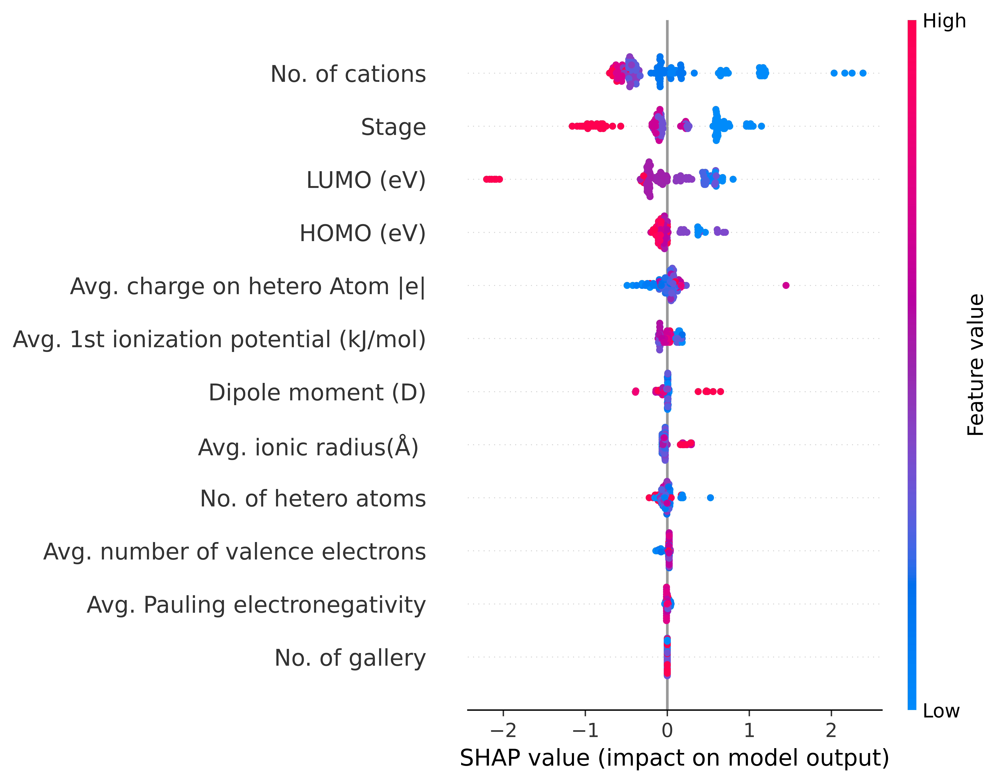

In [ ]:
shap.summary_plot(xg_shap_values, x_train, feature_names=xg_features)

## from X_test, where the E(fx)=-1.09, if F(x) value is more closer to E(fx), then prediction would be good

## lowest_error **system**

bm_pz, Stage=1, No. of cations=8

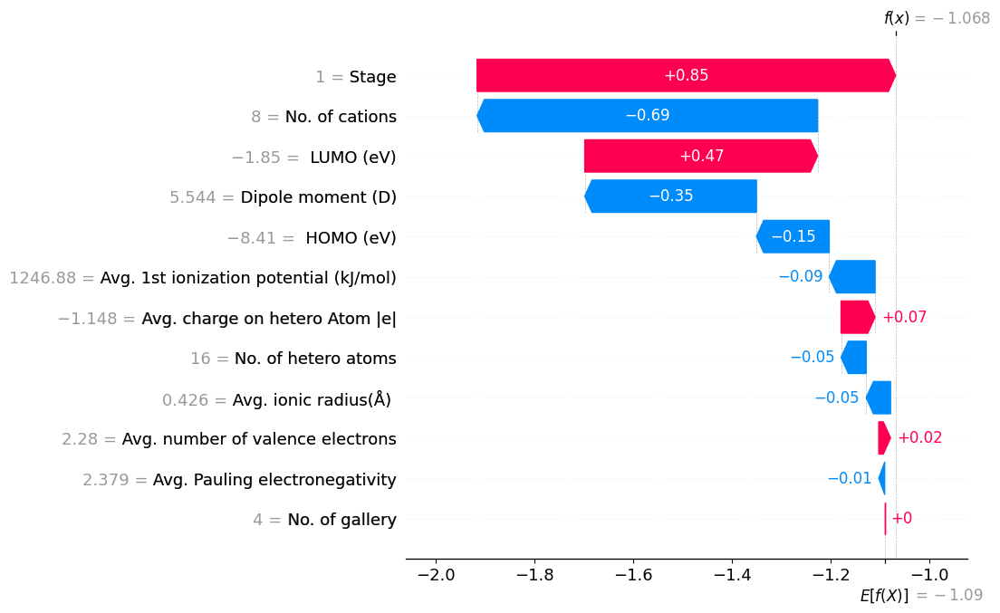

<Figure size 640x480 with 0 Axes>

In [ ]:
shap.plots.waterfall(shap_values[31], max_display=12)
import matplotlib.pyplot as plt
plt.savefig('bm_pz_Stg_1.png', dpi=1200)

In [ ]:
y_train.to_excel('y_train.xlsx')

In [ ]:
shap.initjs()
shap.force_plot(xg_explainer.expected_value,xg_shap_values[31,:], x_test.iloc[31,:], show = False)

N12_pi, Stage=4, No. of Cations=4

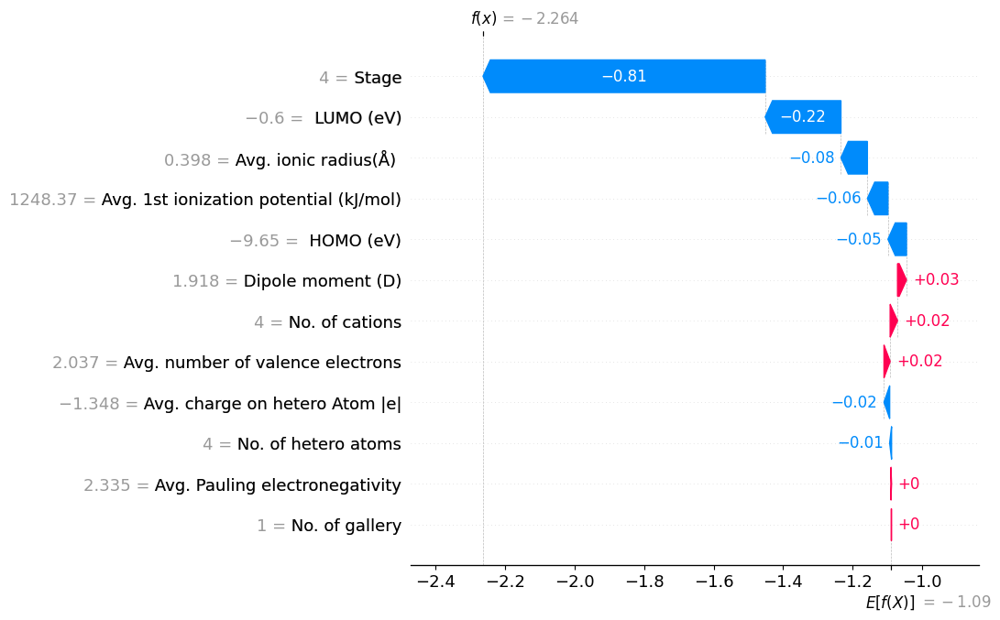

In [ ]:
shap.plots.waterfall(shap_values[32], max_display=12)

In [ ]:
shap.initjs()
shap.force_plot(xg_explainer.expected_value,xg_shap_values[32,:], x_test.iloc[32,:], show = False)

## **highest_error**

N-Et_thz, Stage=4, No. of Cations=4, error=0.4

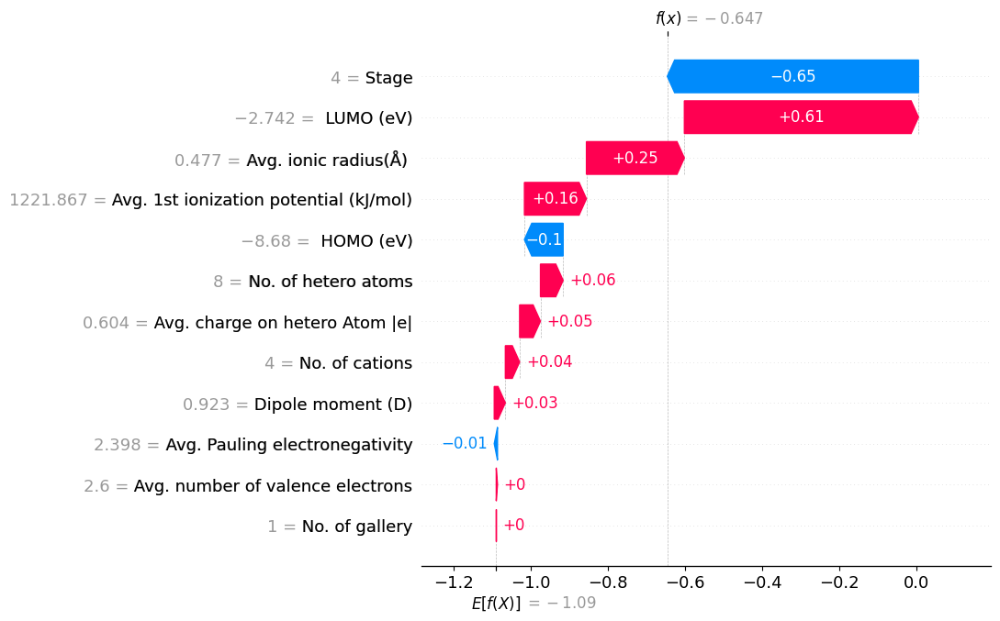

In [ ]:
shap.plots.waterfall(shap_values[12], max_display=12)

In [ ]:
shap.initjs()
shap.force_plot(xg_explainer.expected_value,xg_shap_values[12,:], x_test.iloc[12,:], show = True)

P2222, Stage=1, No. of cations=16

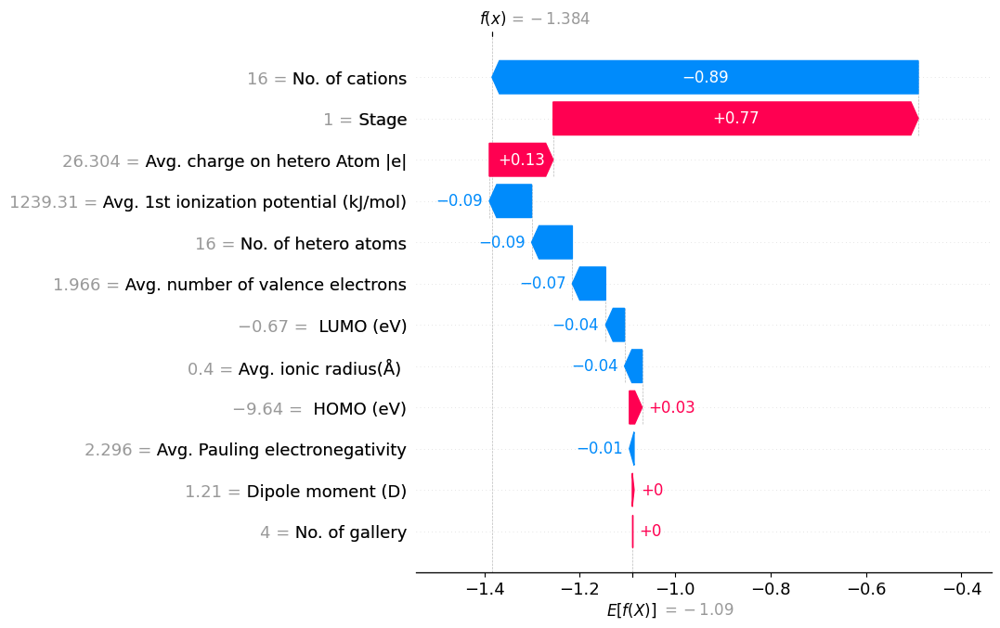

In [ ]:
shap.plots.waterfall(shap_values[0], max_display=12)

In [ ]:
shap.initjs()
shap.force_plot(xg_explainer.expected_value,xg_shap_values[0,:], x_test.iloc[0,:], show = False)

## from **X_train**

# base E(fx)=-1.164 for x_train

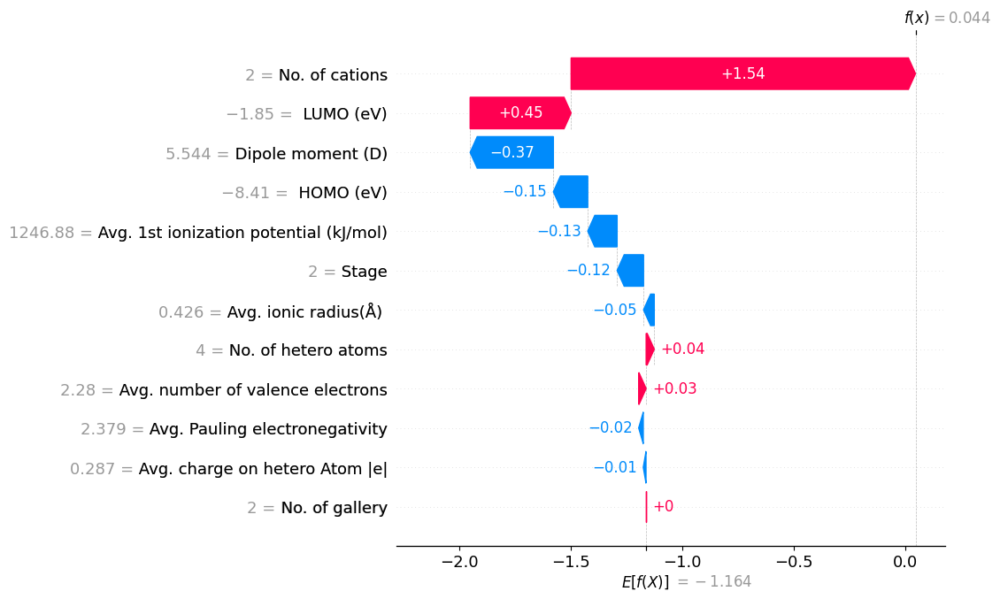

In [ ]:
shap.plots.waterfall(shap_values[2], max_display=12)

In [ ]:
shap.initjs()
shap.force_plot(xg_explainer.expected_value,xg_shap_values[2,:], x_train.iloc[2,:], show = False)

## for checking the chain length of imidazolium **cation**

form DMPI (165, x_test data)

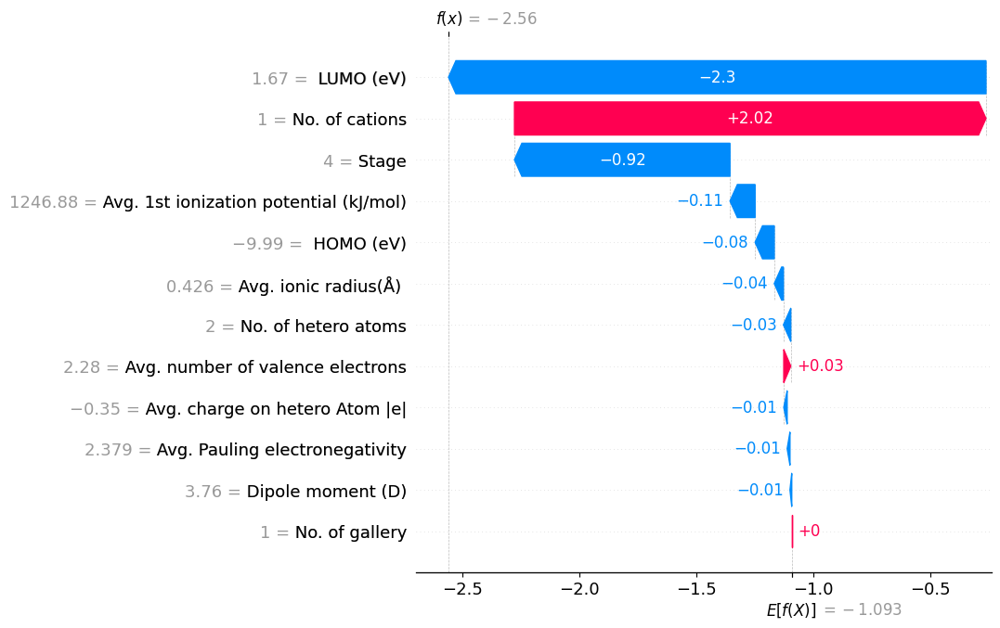

<Figure size 640x480 with 0 Axes>

In [24]:
shap.plots.waterfall(shap_values[2], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=300)

dmpi, 132 row from x_test

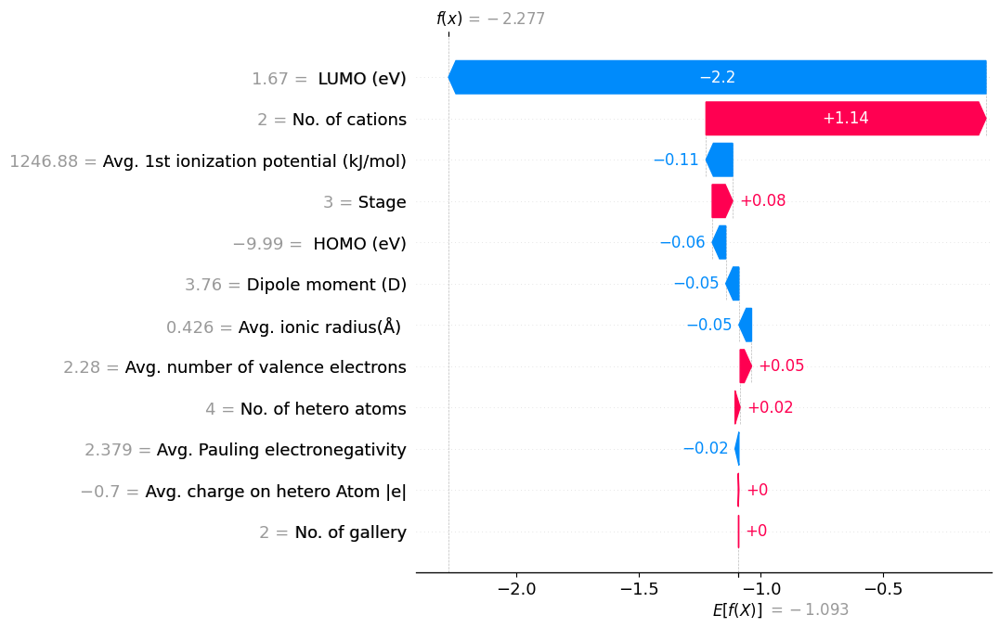

In [25]:
shap.plots.waterfall(shap_values[25], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=300)

BMIM, 168 row from x_test

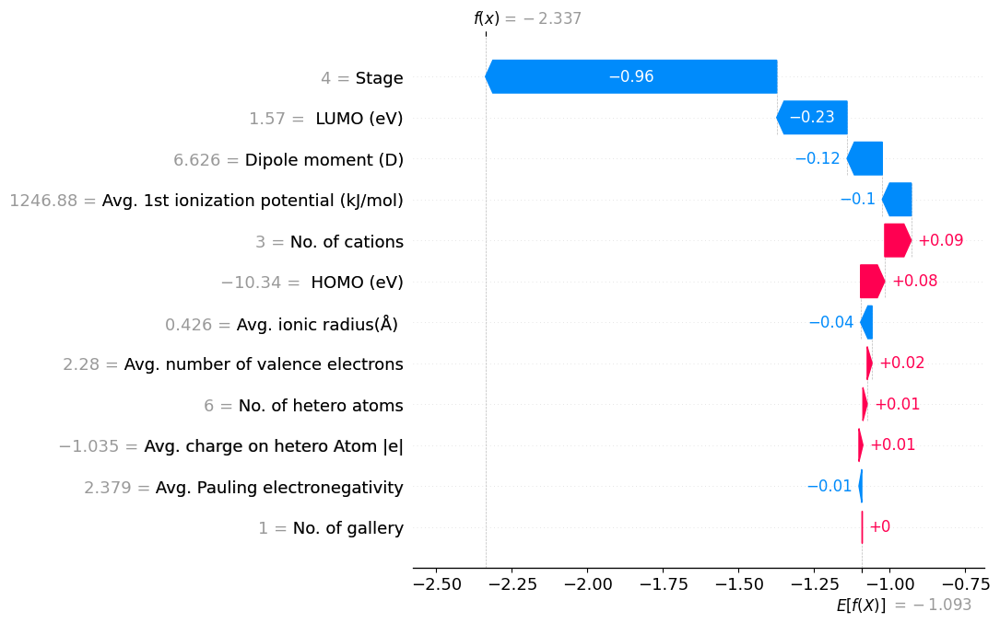

In [26]:
shap.plots.waterfall(shap_values[30], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=300)

# chain length change using x_train

In [27]:
xg_explainer = shap.TreeExplainer(reg_xg)
# Calculate Shap values
xg_shap_values = xg_explainer.shap_values(x_train)
explainer = shap.Explainer(reg_xg, x_train)
shap_values = explainer(x_train)

[06:31:43] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
[06:31:44] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
[06:31:45] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


BMIM row 51 from xtrain

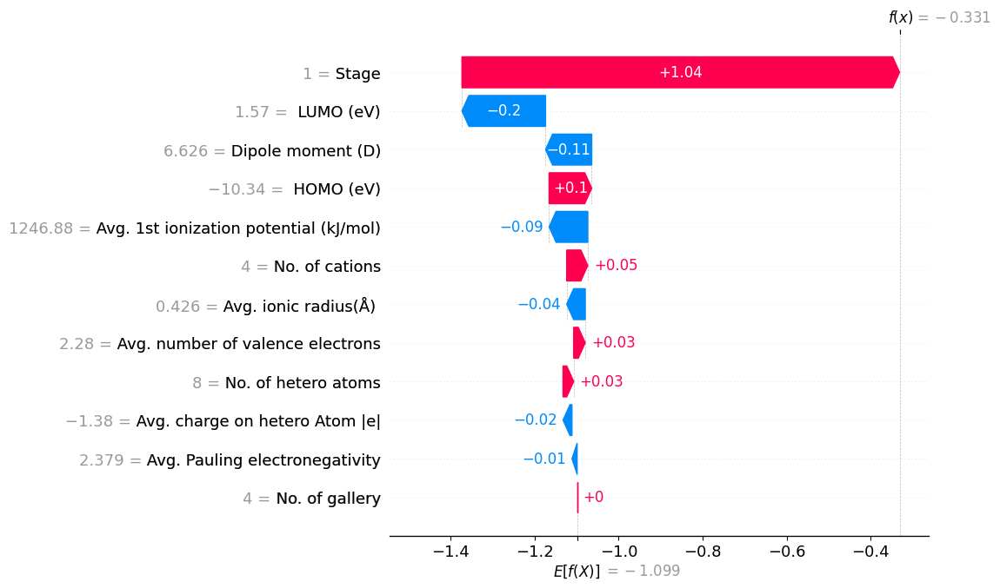

In [28]:
shap.plots.waterfall(shap_values[77], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=1200)

DMPI, 95 row x_train

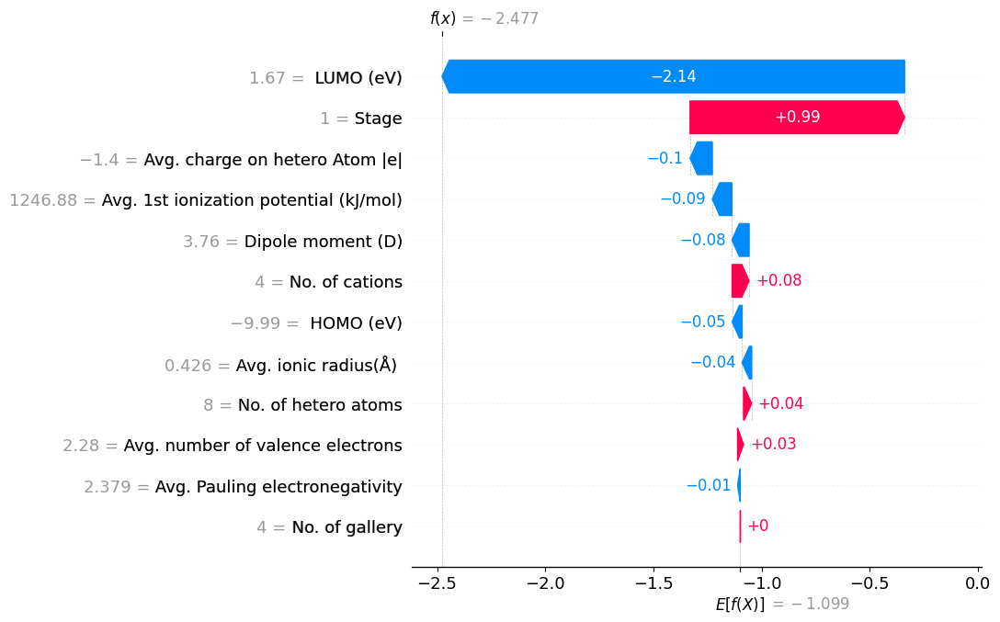

In [29]:
shap.plots.waterfall(shap_values[93], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=1200)

## using PMIM in x_test2 **data**

In [22]:
xg_explainer = shap.TreeExplainer(reg_xg)
# Calculate Shap values
xg_shap_values = xg_explainer.shap_values(x_test2)

[05:06:56] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


In [23]:
explainer = shap.Explainer(reg_xg, x_test2)
shap_values = explainer(x_test2)

[05:06:59] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.
[05:07:00] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


for BMIM in x_test2 data (row 32)

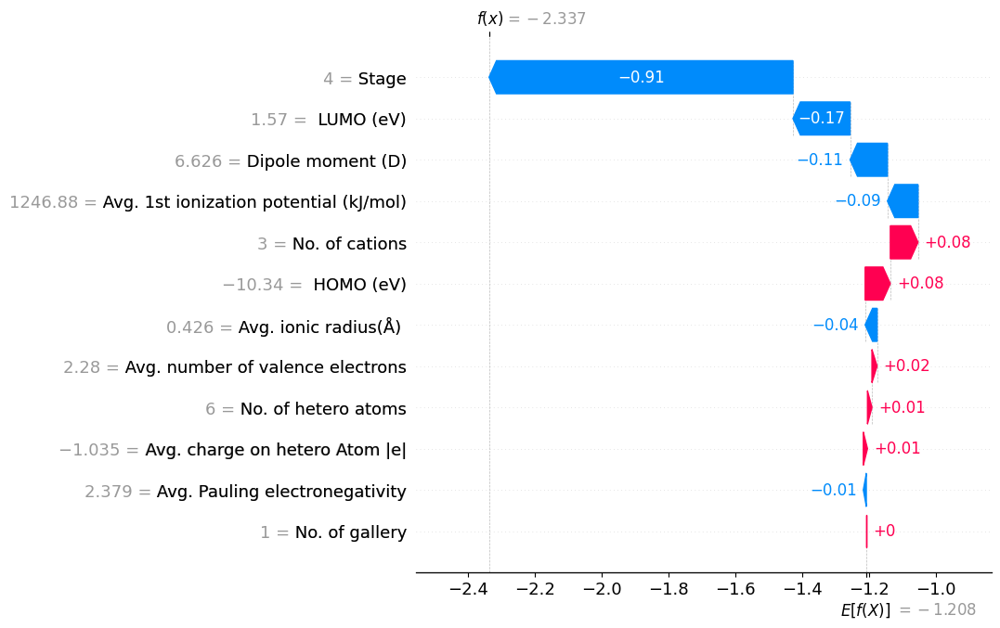

In [25]:
shap.plots.waterfall(shap_values[30], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=1200)

pmim row 36

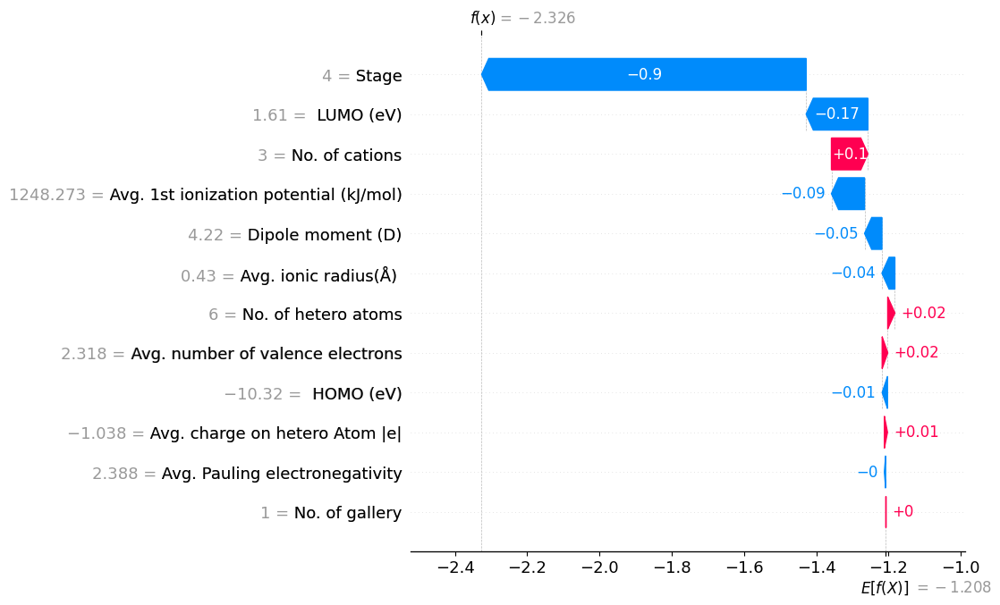

In [26]:
shap.plots.waterfall(shap_values[34], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=1200)

form EMIM row 37 x_test2

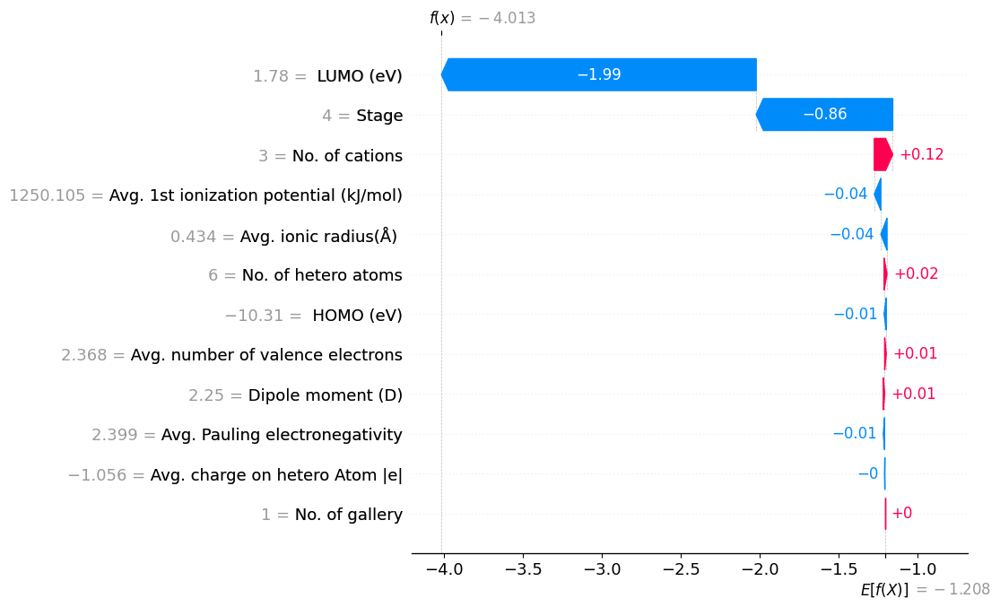

In [24]:
shap.plots.waterfall(shap_values[35], max_display=12)
import matplotlib.pyplot as plt
#plt.savefig('bm_pz_Stg_1.png', dpi=1200)